<a href="https://colab.research.google.com/github/harperd17/cloud_classification/blob/main/EDA/only_clouds.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# This notebook aims to subset the masks to only have pixels that are clouds

Currently there are regions of pixels that are classified as being clouds of a certain type while many of the pixels are not actually clouds. I want to see if I'm able to subset these classified pixels into only pixels that have clouds since that should be a more accurate classification

In [ ]:
!git clone https://github.com/harperd17/cloud_classification.git

Cloning into 'cloud_classification'...
remote: Enumerating objects: 107, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 107 (delta 8), reused 0 (delta 0), pack-reused 84
Receiving objects: 100% (107/107), 1.86 MiB | 11.75 MiB/s, done.
Resolving deltas: 100% (38/38), done.


In [ ]:
!pip install torchsat

In [ ]:
from cloud_classification.helpers.helper_functions import CloudData, show_image_and_masks, decode_pixels, train_network, show_predicted_masks, moveTo

In [ ]:
import pandas as pd
from google.colab import drive

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
drive._mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/Data690/Project/Data

/content/drive/MyDrive/Data690/Project/Data


In [ ]:
train_data = pd.read_csv('train.csv')

In [ ]:
data_dir = '/content/drive/MyDrive/Data690/Project/Data'

In [ ]:
data_ob = CloudData(data_directory=data_dir, mask_df = train_data, data_type = 'train',output_height=512, output_width=512)

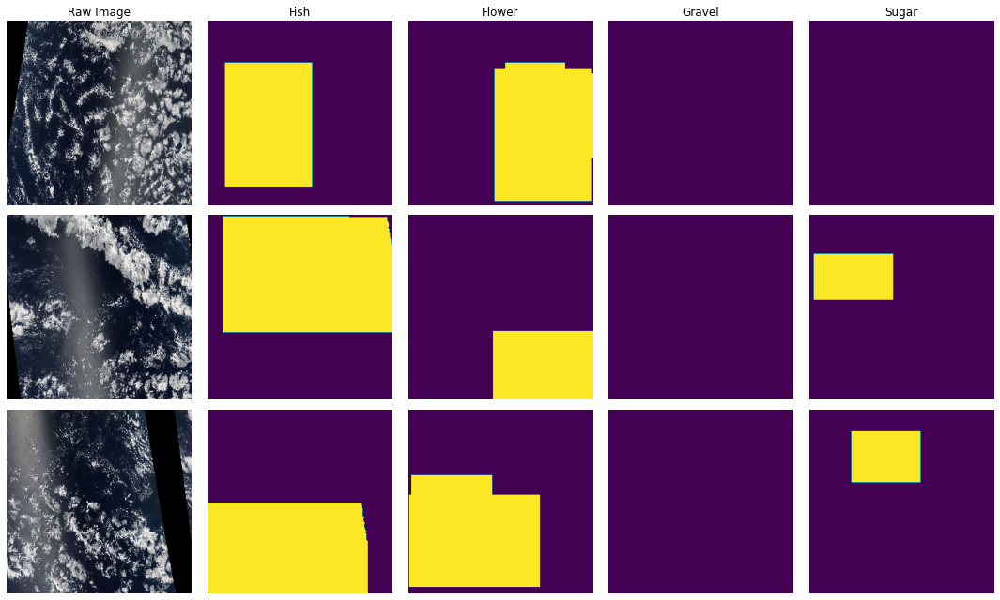

In [ ]:
show_image_and_masks([data_ob[i] for i in range(3)],class_labels=data_ob.classes);

# Try out Binary Thresholding to classify pixels as either being background or foreground

In [ ]:
import skimage
from skimage.filters import try_all_threshold
import numpy as np

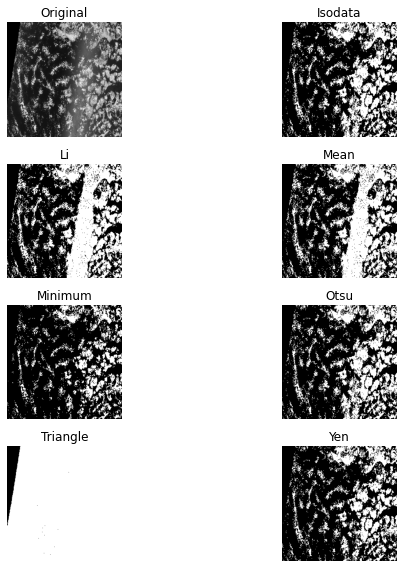

In [ ]:
#https://scikit-image.org/docs/0.13.x/auto_examples/xx_applications/plot_thresholding.html
  # for showing all results from thresholding techniques
#https://stackoverflow.com/questions/41971663/use-numpy-to-convert-rgb-pixel-array-into-grayscale
  # for converting RGB to grayscale
fig, ax = try_all_threshold(np.dot((data_ob[0][0].permute(1,2,0).numpy()*255).astype(np.uint8),[0.299,0.587,0.114]),figsize=(10,8),verbose=False)

# Otsu, Yen, Minimum, and Isodata all look like they do the job correctly. I have used Otsu for OCR before so I am biased and will choose to use that tecnique.

Go through 250 images and convert to binary and see what the results look like. If it looks good for all 250 images I will try adding this as a preprocessing step.

In [ ]:
from skimage.filters import threshold_otsu

In [ ]:
images_to_convert = 50
original_images = []
grayscale_images = []
converted_images = []
for i in range(images_to_convert):
  original_images.append((data_ob[i][0].permute(1,2,0).numpy()*255).astype(np.uint8))
  grayscale_images.append(np.dot((data_ob[i][0].permute(1,2,0).numpy()*255).astype(np.uint8),[0.299,0.587,0.114]))
  otsu_thresh = threshold_otsu(np.dot((data_ob[i][0].permute(1,2,0).numpy()*255).astype(np.uint8),[0.299,0.587,0.114]))
  converted_images.append(np.dot((data_ob[i][0].permute(1,2,0).numpy()*255).astype(np.uint8),[0.299,0.587,0.114]) > otsu_thresh)

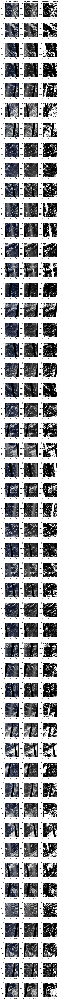

In [ ]:
fig, ax = plt.subplots(images_to_convert,3)
fig.set_size_inches(3*2,images_to_convert*2)
for i in range(images_to_convert):
  ax[i][0].imshow(original_images[i])
  ax[i][1].imshow(grayscale_images[i],cmap=plt.cm.gray)
  ax[i][2].imshow(converted_images[i],cmap=plt.cm.gray)
ax[0][0].set_title('Original Images')
ax[0][1].set_title('Grayscale Images')
ax[0][2].set_title('Thresholded Images')
fig.tight_layout();

There are many images where some brightness in the satellite image is mistakenly treated as being a cloud but it isn't. I will now try a local thresholding technique. The otsu was a global thresholding where the threshold was determed using the entire image. In a local thresholding technique, thresholds are determine using neihborhoods of pixels so the threshold varies from region to region of the image.

In [ ]:
from skimage.filters import threshold_local

In [ ]:
images_to_convert = 50
block_size = 21#29 # how many surrounding pixels to be used in calculating each pixels threshold
original_images = []
grayscale_images = []
converted_images = []
for i in range(images_to_convert):
  original_images.append((data_ob[i][0].permute(1,2,0).numpy()*255).astype(np.uint8))
  grayscale_images.append(np.dot((data_ob[i][0].permute(1,2,0).numpy()*255).astype(np.uint8),[0.299,0.587,0.114]))
  adaptive_thresh = threshold_local(np.dot((data_ob[i][0].permute(1,2,0).numpy()*255).astype(np.uint8),[0.299,0.587,0.114]),block_size)
  converted_images.append(np.dot((data_ob[i][0].permute(1,2,0).numpy()*255).astype(np.uint8),[0.299,0.587,0.114]) > adaptive_thresh)

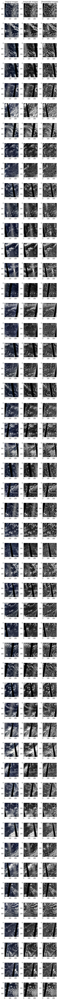

In [ ]:
fig, ax = plt.subplots(images_to_convert,3)
fig.set_size_inches(3*2,images_to_convert*2)
for i in range(images_to_convert):
  ax[i][0].imshow(original_images[i])
  ax[i][1].imshow(grayscale_images[i],cmap=plt.cm.gray)
  ax[i][2].imshow(converted_images[i],cmap=plt.cm.gray)
ax[0][0].set_title('Original Images')
ax[0][1].set_title('Grayscale Images')
ax[0][2].set_title('Thresholded Images')
fig.tight_layout();